In [ ]:
!pip install git+https://github.com/mhsattarian/impawards-movie-poster-downloader

  Cloning https://github.com/mhsattarian/impawards-movie-poster-downloader to /tmp/pip-req-build-o1r3toaj
  Running command git clone -q https://github.com/mhsattarian/impawards-movie-poster-downloader /tmp/pip-req-build-o1r3toaj
  Created wheel for Poster-Downloader: filename=Poster_Downloader-1.1-cp36-none-any.whl size=2025 sha256=591db1f624a3a1e5e11e20c477e6883ef44c5b7bd0290f4a6a7ab8dbfb39951f
  Stored in directory: /tmp/pip-ephem-wheel-cache-dvwypcxs/wheels/a5/43/9a/ba651f849cfd5ddaf4db56d48aa41a319027f1f20c7093640e
Successfully built Poster-Downloader


In [ ]:
# load an example dataset
from vega_datasets import data
cars = data.cars()

import altair as alt

interval = alt.selection_interval()

base = alt.Chart(cars).mark_point().encode(
  y='Miles_per_Gallon',
  color=alt.condition(interval, 'Origin', alt.value('lightgray'))
).properties(
  selection=interval
)

base.encode(x='Acceleration') | base.encode(x='Horsepower')

alt.HConcatChart(...)

In [ ]:
import requests
import logging
from bs4 import BeautifulSoup

def request_soup(url):
	try:
		req = requests.get(url)
		html = req.content
		soup = BeautifulSoup(html, "lxml")
	except requests.exceptions.ConnectionError:
		logging.error("Connection with {} refused. Try again in a few minutes".format(url))
		raise ConnectionError()
	return soup

class Crawler:
	def __init__(self):
		self.title = "ImpAwards"
		self.site = "http://www.impawards.com/"
	
	def crawl(self, search_year, search_terms, possible_links=[]):
		url_base=self.site+"{}/".format(search_year)
		soup = request_soup(url_base+"std.html")
		for movie in soup.findAll('tr'):
			if movie.td.string and all(word in movie.td.string.lower() for word in search_terms):
				title = movie.td.string
				for link in movie.findAll('a',href=True):
					possible_links.append((title, link.get('href')))
					logging.debug("Added {}".format(link.get('href')))
					break
		return possible_links
		
	def get_images(self, search_year, movie_link):
		url_base=self.site+"{}/".format(search_year)
		images = [movie_link]
		soup = request_soup(url_base+movie_link)
		if not soup: return False
		if not soup.find('div',{'id':'altdesigns'}): return images
		for link in soup.find('div',{'id':'altdesigns'}):
			if link.get('href'):
				images.append(link.get('href'))
				logging.debug("Added {}".format(link.get('href')))
		return images

	def get_highest_resolution(self, search_year, img_link, all):
		url_base=self.site+"{}/".format(search_year)
		soup = request_soup(url_base+img_link)
		if not soup: return False
		hq_links = [img_link]
		if not soup.findAll('a',href=True): return hq_links
		for link in soup.findAll('a',href=True):
			if "xlg" in link.get('href').lower() and link.get('href') not in hq_links:
				hq_links.append(link.get('href'))
		if all:
			logging.debug("Total images: {}".format(hq_links))
			return hq_links
		else:
			logging.debug("Changed from {} to {}".format(img_link, hq_links[-1]))
			return [hq_links[-1]]

	def download_img(self, search_year, img_link, dry_run):
		url_base=self.site+"{}/posters/".format(search_year)
		filename = img_link[:-4]+"jpg"
		r = requests.get(url_base+filename)
		if r.status_code == 404:
			logging.error("Error 404 at {}".format(url_base+filename))
			return False
		if not dry_run:
			with open(filename, "wb") as f:
				logging.warning("Downloaded: {}".format(filename))
				f.write(r.content)
		else:
			logging.warning("DRY RUN: Should download {}".format(filename))
		return filename

In [ ]:
#!/usr/bin/env python3

import argparse
import logging
import shutil
import os

def select_link(possible_links, flags):
	if len(possible_links) == 0:
		logging.warning("No movies found")
		return False, False
	elif len(possible_links) == 1 or flags.get('no_confirm'):
		title, movie_link = possible_links[0]
	else:
		for i, tuple in enumerate(possible_links, 1):
			print("\t {:<3} -  {}".format(i, tuple[0]))
		logging.debug("Press return to stop ")
		selection = input("\n Which Movie? [Number] ").lower()
		while not selection.isdigit() or not 0 < int(selection) <= len(possible_links) and selection != "":
			if not selection:
				logging.warning("User canceled action")
				del possible_links[:]
				return False, False
			selection = input("Just write the number: ").lower()
		title,movie_link = possible_links[int(selection) - 1]
	return title, movie_link

def poster_downloader(search=None, flags={}):
	if search:
		search = search.lower().strip().split(' ')
		search_terms, search_year = search[:-1],search[-1]
		if search_year.isdigit():    	
			logging.debug("Searching for " + ' '.join(search_terms).title() + " {}".format(search_year))
		else:
			logging.warning("You must specify the year at the end")
			return False, False
	else:
		search = input("\n Write a movie with the year at the end (ex: The Dark Knight 2008): ")
		return poster_downloader(search, flags)
	crawler = Crawler()
	possible_links = crawler.crawl(search_year, search_terms)
	title, movie_link = select_link(possible_links, flags)
	if not movie_link:
		del possible_links[:]
		return False, False
	logging.info("Found {} at {}".format(title, movie_link))
	images = crawler.get_images(search_year,movie_link)
	if not images:
		logging.warning("No images found")
		del possible_links[:]
		return False, False
	logging.debug("Processing {} images".format(len(images)))
	best_images = []
	for img in images:
		best_images.extend(crawler.get_highest_resolution(search_year,img, flags.get('all')))
	if not best_images:
		del possible_links[:]
		return False, False
	logging.debug("Changed to a total of {} images".format(len(best_images)))
	files = []
	for img in best_images:
		filename = crawler.download_img(search_year, img, flags.get('dry_run'))
		if filename: files.append(filename)
	del possible_links[:]
	return files, title.replace(':', ' ')

def move_files(files, movie_name, dry_run):
	dir = "Posters/" + movie_name
	if not dry_run:
		os.makedirs("Posters", exist_ok=True)
		logging.warning("Posters directory created")
		os.makedirs(dir, exist_ok=True)
		logging.warning("{} directory created".format(dir))
		for file in files:
			try:
				shutil.move(file, dir)
				logging.warning("Moved {} to {}".format(file,dir))
			except Error as e:
				logging.error('Error '+e)
				pass
	else:
		logging.warning("DRY RUN: Should create Posters directory")
		logging.warning("DRY RUN: Should create {} directory".format(dir))
		for file in files:
			logging.warning("DRY RUN: Should move {} to {}".format(file,dir))


def main():
	parser = argparse.ArgumentParser()
	parser.add_argument('command_line_movie',help='Movies can be called from the CLA', nargs='?', action = 'store', default = None)
	parser.add_argument('-f', '--file',help='Bath download from a txt file')
	parser.add_argument('-y', '--no-confirm', help='No confirmation required from you', action='append_const', const=("no_confirm",True), dest='flags')
	parser.add_argument('-a', '--all', help='Download every poster, instead of only the highest resolution available', action='append_const', const=("all",True), dest='flags')
	parser.add_argument('--dry-run', help='Only show what would be done without modifying files', action='append_const', const=("dry_run",True), dest='flags')
	parser.add_argument('-l', '--log', help='Log everything to PosterDownloader.log', action='store_true')

	group = parser.add_mutually_exclusive_group()
	group.add_argument('-v', '--verbose', help='Verbose/Debug logging', action='store_const', const=logging.DEBUG, dest='loglevel')
	group.add_argument('-q', '--quiet', help='Only log file modifications', action='store_const', const=logging.WARN, dest='loglevel')
    
	args = parser.parse_args()
	flags = dict(args.flags) if args.flags else {}
	superformat = '%(levelname)s: %(message)s - %(funcName)s() at %(filename)s.%(lineno)d'
	if args.log:
		console = logging.StreamHandler()
		console.setLevel(args.loglevel or logging.INFO)
		console.setFormatter(logging.Formatter(superformat))
		logging.basicConfig(level=logging.DEBUG, format=superformat, filename='PosterDownloader.log')
		logging.getLogger('').addHandler(console)
	elif args.loglevel:	logging.basicConfig(level=args.loglevel, format=superformat)
	else:  logging.basicConfig(level=logging.INFO, format='%(message)s')
	logging.getLogger("requests").setLevel(logging.WARNING)
	
	if args.file:
		txt = open(args.file)
		for i, movie in enumerate(txt):
			if not movie: break
			try:
				files, movie_name = poster_downloader(movie,flags)
				if files and movie_name: move_files(files, movie_name, flags.get('dry_run'))
			except KeyboardInterrupt:
				logging.error('KeyboardInterrupt')
				continue
		txt.close()
	else:
		try:
			files, movie_name = poster_downloader(args.command_line_movie, flags)
			if files and movie_name: move_files(files, movie_name, flags.get('dry_run'))
		except KeyboardInterrupt:
			logging.error('KeyboardInterrupt')
			pass

In [ ]:
bro = ["The Dark Knight 2008", "Star Wars 1977"]

In [ ]:
for i in bro:
   poster_downloader(i)

Found The Dark Knight at dark_knight.html
Downloaded: dark_knight_xxlg.jpg
Downloaded: dark_knight_ver2_xlg.jpg
Downloaded: dark_knight_ver3_xlg.jpg
Downloaded: dark_knight_ver4_xxlg.jpg
Downloaded: dark_knight_ver5_xxlg.jpg
Downloaded: dark_knight_ver6_xlg.jpg
Downloaded: dark_knight_ver7_xlg.jpg
Downloaded: dark_knight_ver8.jpg
Downloaded: dark_knight_ver9.jpg
Downloaded: dark_knight_ver10_xlg.jpg
Downloaded: dark_knight_ver11_xlg.jpg
Downloaded: dark_knight_ver12_xlg.jpg
Downloaded: dark_knight_ver13_xxlg.jpg
Downloaded: dark_knight_ver14_xxlg.jpg
Downloaded: dark_knight_ver15_xlg.jpg
Downloaded: dark_knight_ver16_xlg.jpg
Downloaded: dark_knight_ver17_xlg.jpg
Downloaded: dark_knight_ver18_xlg.jpg
Downloaded: dark_knight_ver19_xlg.jpg
Downloaded: dark_knight_ver20_xlg.jpg
Downloaded: dark_knight_ver21_xlg.jpg
Downloaded: dark_knight_ver22_xlg.jpg
Downloaded: dark_knight_ver23_xlg.jpg
Downloaded: dark_knight_ver24_xlg.jpg
Found Star Wars at star_wars.html
Downloaded: star_wars_xxlg.jp

In [ ]:
poster_downloader("The Dark Knight 2008")

You must specify the year at the end


(False, False)

In [ ]:
!ls

dark_knight_ver10_xlg.jpg   dark_knight_ver23_xlg.jpg
dark_knight_ver11_xlg.jpg   dark_knight_ver24_xlg.jpg
dark_knight_ver12_xlg.jpg   dark_knight_ver2_xlg.jpg
dark_knight_ver13_xxlg.jpg  dark_knight_ver3_xlg.jpg
dark_knight_ver14_xxlg.jpg  dark_knight_ver4_xxlg.jpg
dark_knight_ver15_xlg.jpg   dark_knight_ver5_xxlg.jpg
dark_knight_ver16_xlg.jpg   dark_knight_ver6_xlg.jpg
dark_knight_ver17_xlg.jpg   dark_knight_ver7_xlg.jpg
dark_knight_ver18_xlg.jpg   dark_knight_ver8.jpg
dark_knight_ver19_xlg.jpg   dark_knight_ver9.jpg
dark_knight_ver20_xlg.jpg   dark_knight_xxlg.jpg
dark_knight_ver21_xlg.jpg   sample_data
dark_knight_ver22_xlg.jpg


In [ ]:
#!pip install Pillow
from PIL import Image
import requests
from io import BytesIO

dog_img = Image.open('dark_knight_xxlg.jpg')

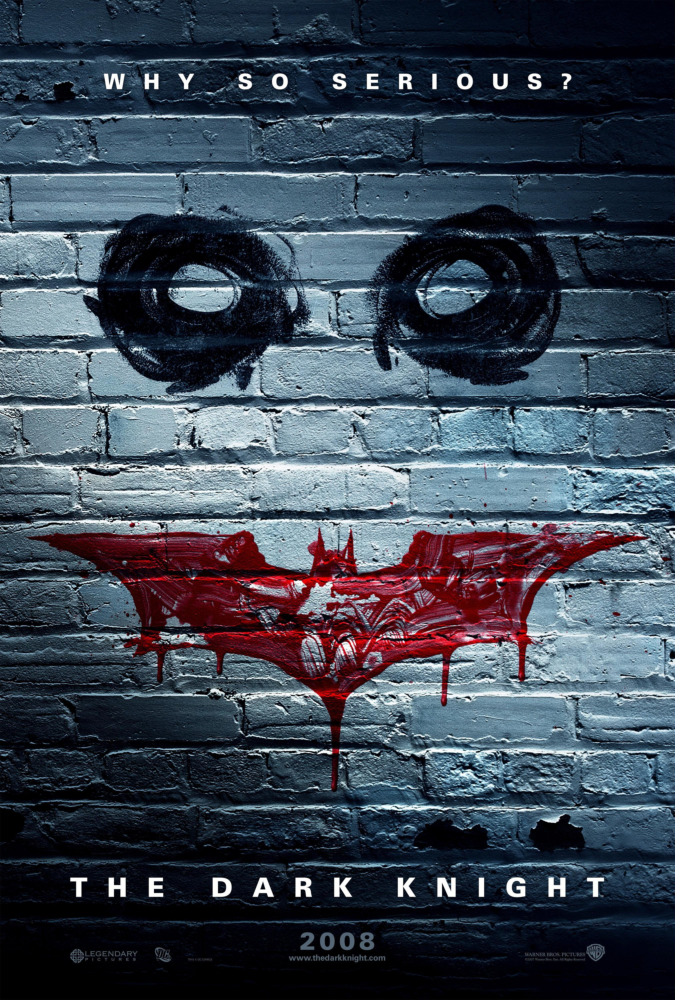

In [ ]:
dog_img

Getting dataset directly from imdb. 

In [24]:
from six.moves import urllib
import pandas as pd 
import gzip

handle = urllib.request.urlopen('https://datasets.imdbws.com/title.basics.tsv.gz') #download
file = gzip.GzipFile(fileobj=handle) #unzip

movies = pd.read_csv(file, sep="\t")

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [2]:
display(movies.columns)
display(movies.dtypes)

Index(['tconst', 'titleType', 'primaryTitle', 'originalTitle', 'isAdult',
       'startYear', 'endYear', 'runtimeMinutes', 'genres'],
      dtype='object')

tconst            object
titleType         object
primaryTitle      object
originalTitle     object
isAdult           object
startYear         object
endYear           object
runtimeMinutes    object
genres            object
dtype: object

Looks like startYear, endYear, and runtimeMinutes are objects. We need to convert Years to numerical values for filtering.

In [3]:
movies

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,tt0000001,short,Carmencita,Carmencita,0,1894,\N,1,"Documentary,Short"
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,1892,\N,5,"Animation,Short"
2,tt0000003,short,Pauvre Pierrot,Pauvre Pierrot,0,1892,\N,4,"Animation,Comedy,Romance"
3,tt0000004,short,Un bon bock,Un bon bock,0,1892,\N,12,"Animation,Short"
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,1893,\N,1,"Comedy,Short"
...,...,...,...,...,...,...,...,...,...
7591407,tt9916848,tvEpisode,Episode #3.17,Episode #3.17,0,2010,\N,\N,"Action,Drama,Family"
7591408,tt9916850,tvEpisode,Episode #3.19,Episode #3.19,0,2010,\N,\N,"Action,Drama,Family"
7591409,tt9916852,tvEpisode,Episode #3.20,Episode #3.20,0,2010,\N,\N,"Action,Drama,Family"
7591410,tt9916856,short,The Wind,The Wind,0,2015,\N,27,Short


In [4]:
movies.iloc[65776]

tconst                        tt0067100
titleType                         movie
primaryTitle                Firecracker
originalTitle               Firecracker
isAdult                               0
startYear                          1981
endYear                              \N
runtimeMinutes                       77
genres            Action,Drama,Thriller
Name: 65776, dtype: object

We can see that some observations have the string \N. This needs to be replaced before we can convert the column to numeric. We will also confirm if we are missing values from year (these will be removed)

In [5]:
# Replacing the \N

movies['startYear'] = movies['startYear'].str.replace(r'\\N','0', regex=True)
movies['startYear'] = pd.to_numeric(movies['startYear'])

movies['endYear'] = movies['endYear'].str.replace(r'\\N','0', regex=True)
movies['endYear'] = pd.to_numeric(movies['endYear'])

In [6]:
movies[movies['startYear'].isnull()]

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,tt0000001,short,Carmencita,Carmencita,0,NaN,0,1,"Documentary,Short"
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,NaN,0,5,"Animation,Short"
2,tt0000003,short,Pauvre Pierrot,Pauvre Pierrot,0,NaN,0,4,"Animation,Comedy,Romance"
3,tt0000004,short,Un bon bock,Un bon bock,0,NaN,0,12,"Animation,Short"
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,NaN,0,1,"Comedy,Short"
...,...,...,...,...,...,...,...,...,...
65531,tt0066853,movie,Na Boca da Noite,Na Boca da Noite,0,NaN,0,68,Drama
65532,tt0066854,movie,Who Cares: Anatomy of a Delivery Boy,Bof... Anatomie d'un livreur,0,NaN,0,110,Comedy
65533,tt0066855,movie,Bonaparte et la révolution,Bonaparte et la révolution,0,NaN,0,275,"Drama,History"
65534,tt0066856,movie,Born to Win,Born to Win,0,NaN,0,88,"Comedy,Crime,Drama"


In [7]:
# Getting rid of na's
movies.dropna(subset=['primaryTitle','startYear', 'genres'],axis=0, inplace=True)

In [8]:
# Observing null values and converting dataframe to int
movies[movies['startYear'].isnull()]
movies['startYear'] = movies['startYear'].astype(int)

In [9]:
display(movies.dtypes)

tconst            object
titleType         object
primaryTitle      object
originalTitle     object
isAdult           object
startYear          int64
endYear            int64
runtimeMinutes    object
genres            object
dtype: object

Filtering out unneeded columns

In [10]:
movies.drop(['tconst', 'originalTitle', 'endYear', 'runtimeMinutes'], axis=1, inplace=True)

Getting rid of unneccessary columns 

In [11]:
tvSeries = movies['titleType'].str.upper().str.contains("TVSERIES", na=False)
tvEpisode = movies['titleType'].str.upper().str.contains("TVEPISODE", na=False)
video =  movies['titleType'].str.upper().str.contains("VIDEO", na=False)
short =  movies['titleType'].str.upper().str.contains("SHORT", na=False)
genres = movies['genres'].str.contains(r'\\N', regex=True, na=False)

In [12]:
movies_clean = movies[~(tvSeries | tvEpisode | video | short | genres)]

In [13]:
movies_clean = movies_clean[movies_clean['isAdult']==0]

In [14]:
display(movies_clean)

,titleType,primaryTitle,isAdult,startYear,genres
65536,movie,The Boy Friend,0,1971,"Comedy,Musical,Romance"
65537,tvMovie,The Bravos,0,1972,Western
65538,movie,Brazil: A Report on Torture,0,1971,Documentary
65539,movie,The Breaking of Bumbo,0,1970,Comedy
65540,movie,The Birch Tree,0,1967,"Drama,Romance"
...,...,...,...,...,...
7591301,movie,Rodolpho Teóphilo - O Legado de um Pioneiro,0,2015,Documentary
7591328,movie,De la ilusión al desconcierto: cine colombiano...,0,2007,Documentary
7591333,tvMovie,Teatroteka: Czlowiek bez twarzy,0,2015,Drama
7591340,movie,Dankyavar Danka,0,2013,Comedy


In [23]:
movies_clean['genres'].str.contains(',')

KeyError: ignored

In [21]:
movies_clean.genres.value_counts()

AttributeError: ignored

In [17]:
movies_horror = movies_clean[movies['genres'].str.upper().str.contains('HORROR')]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


In [18]:
movies_horror

,titleType,primaryTitle,isAdult,startYear,genres
65541,movie,The Brotherhood of Satan,0,1971,Horror
65549,movie,Burke & Hare,0,1972,Horror
65565,movie,Capulina contra los vampiros,0,1971,"Comedy,Fantasy,Horror"
65571,movie,Carnival of Blood,0,1970,Horror
65592,movie,A Virgin Among the Living Dead,0,1973,Horror
...,...,...,...,...,...
7588587,movie,Hellavator,0,0,Horror
7588771,movie,Hellavator,0,0,Horror
7590448,movie,The New Estate,0,0,"Adventure,Horror"
7590617,movie,#WorstThing,0,0,Horror


We will split the genres up, and we will keep only the first genre listed

In [19]:
movies_clean = pd.concat([movies_clean[['primaryTitle']], movies_clean[['startYear']], movies_clean['genres'].str.split(',', expand=True)], axis=1)

In [20]:
movies_clean['title + year'] = movies_clean.agg(lambda x: f"{x['primaryTitle']} {x['startYear']}", axis=1)

In [ ]:
movies_clean

,primaryTitle,startYear,0,1,2,Title + Year
65536,Born to Win,1971,Comedy,Crime,Drama,Born to Win 1971
65537,Rum Runners,1971,Adventure,Comedy,None,Rum Runners 1971
65538,The Boy Friend,1971,Comedy,Musical,Romance,The Boy Friend 1971
65539,The Bravos,1972,Western,None,None,The Bravos 1972
65540,Brazil: A Report on Torture,1971,Documentary,None,None,Brazil: A Report on Torture 1971
...,...,...,...,...,...,...
7330322,Rodolpho Teóphilo - O Legado de um Pioneiro,2015,Documentary,None,None,Rodolpho Teóphilo - O Legado de um Pioneiro 2015
7330349,De la ilusión al desconcierto: cine colombiano...,2007,Documentary,None,None,De la ilusión al desconcierto: cine colombiano...
7330354,Teatroteka: Czlowiek bez twarzy,2015,Drama,None,None,Teatroteka: Czlowiek bez twarzy 2015
7330361,Dankyavar Danka,2013,Comedy,None,None,Dankyavar Danka 2013


In [ ]:
movies_clean = movies_clean.rename({'primaryTitle': 'title', 'startYear': 'year', 0: 'genre', 1: 'genre1', 1: 'genre2', 2: 'genre3'}, axis=1)  # new method

In [ ]:
movies_clean

,title,year,genre,genre2,genre3,Title + Year
65536,Born to Win,1971,Comedy,Crime,Drama,Born to Win 1971
65537,Rum Runners,1971,Adventure,Comedy,None,Rum Runners 1971
65538,The Boy Friend,1971,Comedy,Musical,Romance,The Boy Friend 1971
65539,The Bravos,1972,Western,None,None,The Bravos 1972
65540,Brazil: A Report on Torture,1971,Documentary,None,None,Brazil: A Report on Torture 1971
...,...,...,...,...,...,...
7330322,Rodolpho Teóphilo - O Legado de um Pioneiro,2015,Documentary,None,None,Rodolpho Teóphilo - O Legado de um Pioneiro 2015
7330349,De la ilusión al desconcierto: cine colombiano...,2007,Documentary,None,None,De la ilusión al desconcierto: cine colombiano...
7330354,Teatroteka: Czlowiek bez twarzy,2015,Drama,None,None,Teatroteka: Czlowiek bez twarzy 2015
7330361,Dankyavar Danka,2013,Comedy,None,None,Dankyavar Danka 2013


In [ ]:
movies_clean.drop(columns=['genre2', 'genre3'], axis=1, inplace=True)

In [ ]:
movies_clean

,title,year,genre,Title + Year
65536,Born to Win,1971,Comedy,Born to Win 1971
65537,Rum Runners,1971,Adventure,Rum Runners 1971
65538,The Boy Friend,1971,Comedy,The Boy Friend 1971
65539,The Bravos,1972,Western,The Bravos 1972
65540,Brazil: A Report on Torture,1971,Documentary,Brazil: A Report on Torture 1971
...,...,...,...,...
7330322,Rodolpho Teóphilo - O Legado de um Pioneiro,2015,Documentary,Rodolpho Teóphilo - O Legado de um Pioneiro 2015
7330349,De la ilusión al desconcierto: cine colombiano...,2007,Documentary,De la ilusión al desconcierto: cine colombiano...
7330354,Teatroteka: Czlowiek bez twarzy,2015,Drama,Teatroteka: Czlowiek bez twarzy 2015
7330361,Dankyavar Danka,2013,Comedy,Dankyavar Danka 2013


Filter out movies based on year

In [ ]:
# Filtering out movies that haven't been released yet

from datetime import date
year = date.today().year

movies_clean = movies_clean[movies_clean['year']<=year]

# Filtering out movies from 1920 up

movies_clean = movies_clean[movies_clean['year']>1920]

In [ ]:
movies_clean

,title,year,genre,Title + Year
65536,Born to Win,1971,Comedy,Born to Win 1971
65537,Rum Runners,1971,Adventure,Rum Runners 1971
65538,The Boy Friend,1971,Comedy,The Boy Friend 1971
65539,The Bravos,1972,Western,The Bravos 1972
65540,Brazil: A Report on Torture,1971,Documentary,Brazil: A Report on Torture 1971
...,...,...,...,...
7330322,Rodolpho Teóphilo - O Legado de um Pioneiro,2015,Documentary,Rodolpho Teóphilo - O Legado de um Pioneiro 2015
7330349,De la ilusión al desconcierto: cine colombiano...,2007,Documentary,De la ilusión al desconcierto: cine colombiano...
7330354,Teatroteka: Czlowiek bez twarzy,2015,Drama,Teatroteka: Czlowiek bez twarzy 2015
7330361,Dankyavar Danka,2013,Comedy,Dankyavar Danka 2013


In [ ]:
movies_clean['genre'].value_counts()

Drama          133866
Documentary    120173
Comedy          89912
Action          39313
Crime           17590
Biography       15336
Adventure       13882
Horror          13630
Music           13160
Thriller         8183
Family           7007
Romance          6406
Sport            6389
Animation        5661
Reality-TV       3572
Musical          3387
Mystery          3211
Fantasy          3064
Sci-Fi           2342
History          2168
Talk-Show        1934
News             1804
Western          1193
War               989
Short             717
Game-Show         711
Adult              34
Film-Noir           1
Name: genre, dtype: int64